In [1]:
#IMPORT THE NECESSARY LIBRARIES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [2]:
#READ IN THE DATA
df = df = pd.read_csv(r"C:\Users\USER\OneDrive\Desktop\365 data\music_dataset_mod.csv")
df

,Tempo,Dynamics Range,Vocal Presence,Percussion Strength,String Instrument Detection,Electronic Element Presence,Rhythm Complexity,Drums Influence,Distorted Guitar,Metal Frequencies,Ambient Sound Influence,Instrumental Overlaps,Genre
0,114.618354,57.976367,53.251766,99.061840,14.686768,17.628630,46.545522,75.839434,79.378892,71.753088,96.439665,53.771763,Country
1,116.672803,69.387087,95.787280,90.831033,47.280419,-15.618194,85.421085,100.455908,0.713015,0.000000,17.327295,15.017146,Classical
2,128.328121,52.930677,65.701187,104.439247,5.984994,50.467388,18.006722,77.642913,80.652946,87.692110,95.125207,25.308020,Rock
3,128.511337,25.494755,14.095374,40.106130,47.715584,87.335201,68.603329,63.536557,74.888346,76.239108,97.016998,96.893109,Hip-hop
4,135.474190,45.174876,101.469872,70.002203,108.177637,25.865590,31.295163,81.121030,36.178193,23.381542,53.753793,30.142986,Country
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,66.578839,54.533872,99.782246,95.633310,91.414514,19.396142,36.280860,78.298955,4.890606,4.638077,75.479656,95.990077,NaN
996,126.570862,57.812829,90.809940,64.880583,40.437517,38.051344,66.204244,95.770959,1.745673,6.729019,82.042218,43.590027,Classical
997,121.731543,51.385204,33.849400,17.044544,84.483481,13.312790,8.953013,64.068960,90.738580,96.043437,5.499350,74.604889,Rock
998,97.070804,19.210429,62.662860,22.720453,66.917937,80.590809,51.403310,50.828636,68.518232,55.119045,21.781372,24.716517,Rock


Description of the features
- Tempo: Beats per minute (BPM) of the track.
		
- Dynamic Range: The range between the quietest and loudest parts of a track, typically measured in decibels (dB).
		
- Vocal Presence: The prominence of vocals in a track.
		
- Percussion Strength: the intensity and presence of percussion instruments in a track, such as drums or cymbals.
		
- String Instrument Detection: The presence and prominence of string instruments like guitars, violins, or cellos in a track.
		
- Electronic Element Presence: The intensity and presence of percussion instruments in a track, such as drums or cymbals.
		
- Rhythm Complexity: The complexity and variation in a track's rhythm patterns, reflect the intricacy of its beat and timing.
		
- Drums Influence: The drums contribute to the overall sound of a track, focusing on their impact rather than just presence.
		
- Distorted Guitar: The extent to which electronic sounds or synthesizers are used in a track.
		
- Metal Frequencies: The use of distorted guitar sounds, often associated with genres like rock or metal.
		
- Ambient Sound Influence: The use of ambient sounds in a track, which can add texture and atmospheric elements to the music.
		
- Instrumental Overlaps: How different instruments interplay and overlap in a track, indicating the complexity of its instrumental arrangement.
		
- Genre: The categorized genre of the track

In [3]:
#CHECK THE INFORMATION ABOUT THE DATA.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Tempo                        1000 non-null   float64
 1   Dynamics Range               1000 non-null   float64
 2   Vocal Presence               1000 non-null   float64
 3   Percussion Strength          1000 non-null   float64
 4   String Instrument Detection  1000 non-null   float64
 5   Electronic Element Presence  1000 non-null   float64
 6   Rhythm Complexity            1000 non-null   float64
 7   Drums Influence              1000 non-null   float64
 8   Distorted Guitar             1000 non-null   float64
 9   Metal Frequencies            1000 non-null   float64
 10  Ambient Sound Influence      1000 non-null   float64
 11  Instrumental Overlaps        1000 non-null   float64
 12  Genre                        890 non-null    object 
dtypes: float64(12), obj

The Genre column shows that it contains missing values. We will use have to fill this up. All the datatypes are in the correct type

In [4]:
#CREATING A COPY OF THE DATA
df2 = df.copy()

<Axes: xlabel='Genre', ylabel='count'>

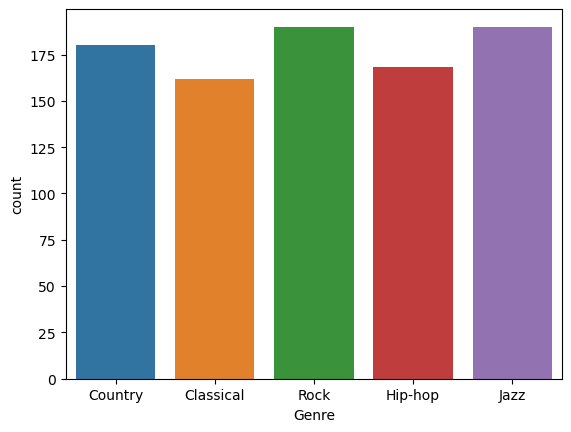

In [5]:
#COUNTING THE NUMBER OF INSTANCES IN THE GENRE COLUMN
sns.countplot(df2,x='Genre')

<Axes: >

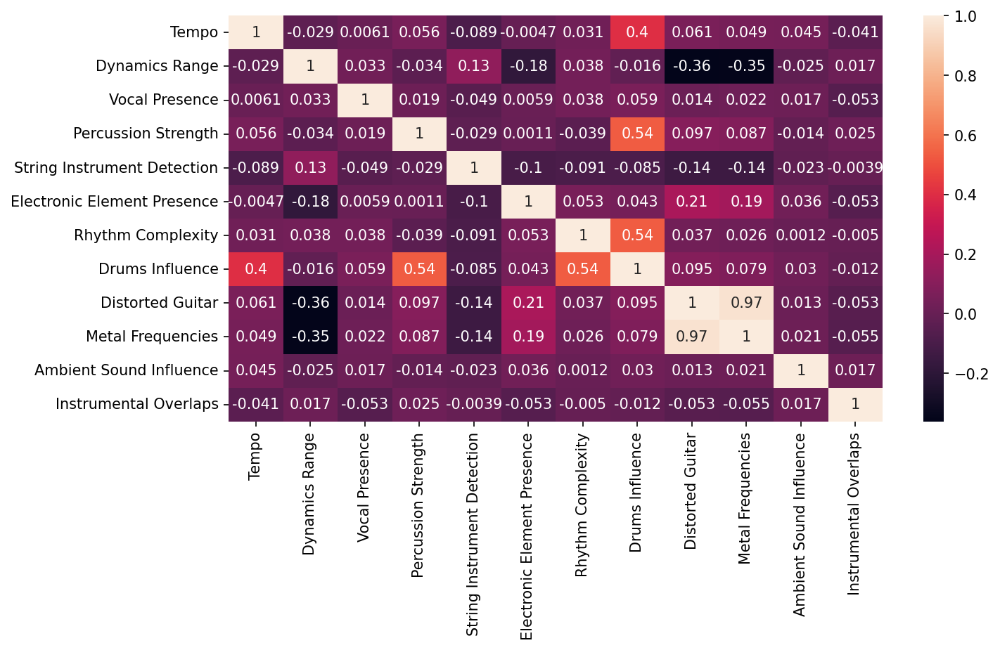

In [6]:
plt.figure(figsize=(10,5),dpi=150)
sns.heatmap(df2.corr(numeric_only=True),annot=True)

From the map above, it shows that there is not so strong of correlation between Precision strength, rhythm complexity, drum inflence and tempo. There is a strong negative correlation between string instrument detection and electronic element presence. This lack of correlation is expected because "String Instrument Detection" likely measures the presence or characteristics of string instruments, while "Electronic Element Presence" pertains to the use of electronic sounds or effects.

<Axes: xlabel='String Instrument Detection', ylabel='Electronic Element Presence'>

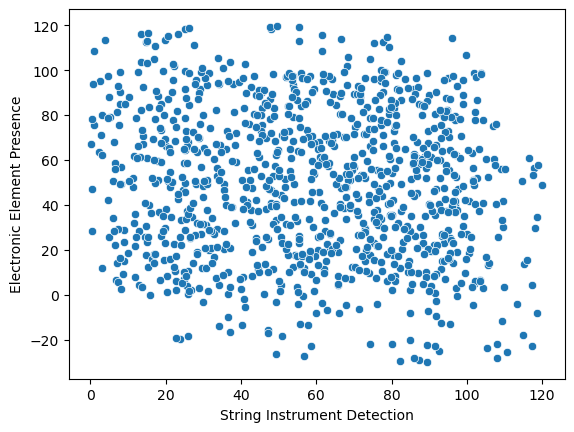

In [7]:
#A SCATTERPLOT SHOWING THE RELATIONSHIP BETWEEN STRING INSTRUMENT DETECTION AND ELECTRONIC ELEMENT PRESENCE
sns.scatterplot(data=df2,x='String Instrument Detection',y='Electronic Element Presence')
#plt.legend(loc=(1.05,0.7))

There is no correlation between Electronic Element Presence and String Instrument Detection

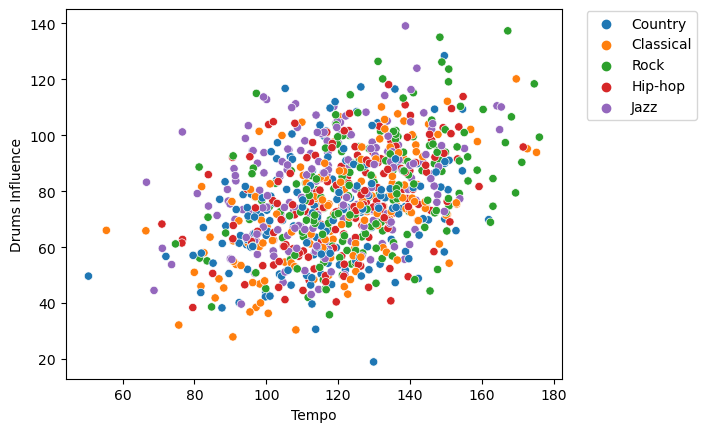

In [8]:
#SCATTERPLOT SHOWING THE RELATIONSHIP BETWEEN TEMPO AND DRUMS INFLUENCE
sns.scatterplot(data=df2,x='Tempo',y='Drums Influence',hue='Genre')
plt.legend(loc=(1.05,0.7))

The plot shows that as the tempo increases, drum inflence also increases. We can say that the fast-paced a song is, the stronger the influence of the drum

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


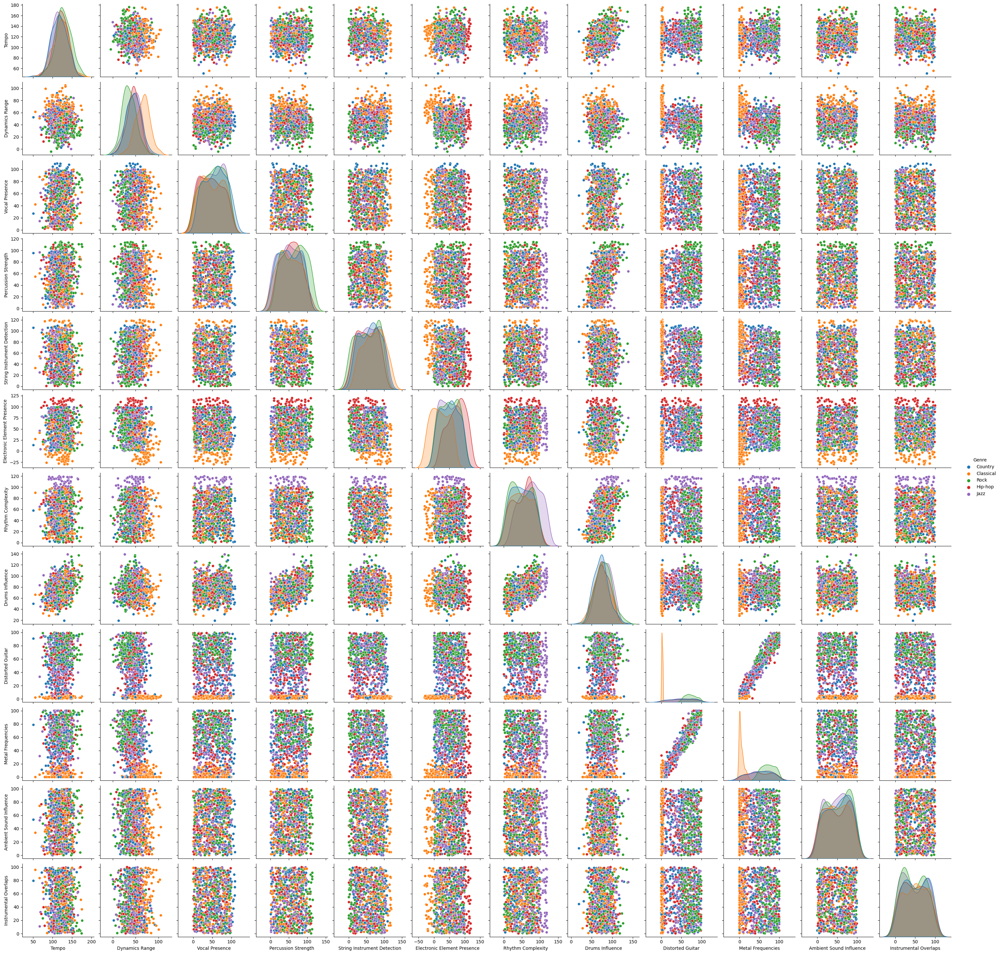

In [9]:
sns.pairplot(df2[:-1],hue='Genre')

In [10]:
#DROPPING THE MISSING VALUES
cleaned_data = df2.dropna()

In [11]:
X = cleaned_data.drop('Genre',axis=1)
y = cleaned_data['Genre']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [13]:
#SCALING IS AN ESSENTIAL PART OF PCA.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [14]:
#DETERMING THE NUMBER OF PRINCIPAL COMPONENT THAT EXPLAINS UP TO 80% OF THE VARIATION IN THE DATA
explained_var = []

for n in range(1,12):
    pca_model = PCA(n_components=n)
    pca_model.fit(X_train_scaled)
    
    explained_var.append(np.sum(pca_model.explained_variance_ratio_))

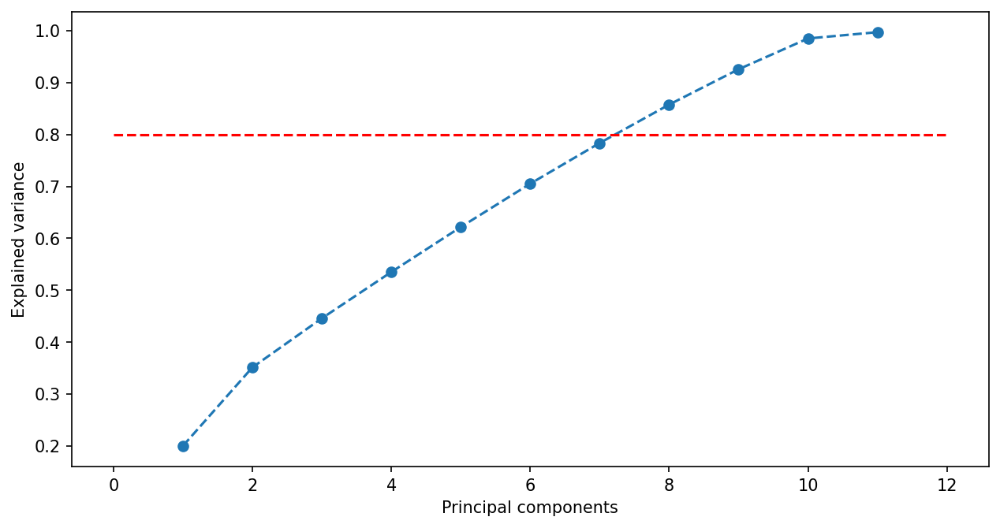

In [15]:
plt.figure(figsize=(10,5),dpi=150)
plt.plot(range(1,12),explained_var,"o--")
plt.xlabel('Principal components')
plt.ylabel('Explained variance')
plt.hlines(y=0.8,xmin=0,xmax=12,colors='red',linestyles='--');

In [16]:
pca = PCA(n_components=8)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [17]:
#PERFORMING LOGISTIC REGRESSION ON THE PRINCIPAL COMPONENTS
log_pca = LogisticRegression(max_iter=10000,random_state=42)
log_pca.fit(X_train_pca,y_train)
log_predict = log_pca.predict(X_test_pca)

In [31]:
print(classification_report(y_test,log_predict))

              precision    recall  f1-score   support

   Classical       0.89      0.98      0.93        51
     Country       0.34      0.25      0.29        52
     Hip-hop       0.48      0.44      0.46        48
        Jazz       0.41      0.42      0.42        62
        Rock       0.50      0.61      0.55        54

    accuracy                           0.54       267
   macro avg       0.52      0.54      0.53       267
weighted avg       0.52      0.54      0.52       267



In [18]:
#FITTING AND PREDICTING USING THE ORIGINAL DATA.
log_original = LogisticRegression(max_iter=10000,random_state=42)
log_original.fit(X_train_scaled,y_train)
y_original_pred = log_original.predict(X_test_scaled)

In [19]:
print(classification_report(y_test,y_original_pred))

              precision    recall  f1-score   support

   Classical       0.86      0.98      0.92        51
     Country       0.33      0.25      0.28        52
     Hip-hop       0.44      0.46      0.45        48
        Jazz       0.43      0.37      0.40        62
        Rock       0.49      0.59      0.54        54

    accuracy                           0.52       267
   macro avg       0.51      0.53      0.52       267
weighted avg       0.51      0.52      0.51       267



In [20]:
print(confusion_matrix(y_test,y_original_pred))

[[50  1  0  0  0]
 [ 4 13 11 15  9]
 [ 0  9 22  6 11]
 [ 4 12 10 23 13]
 [ 0  5  7 10 32]]


In [21]:
print(confusion_matrix(y_test,log_predict))

[[50  0  1  0  0]
 [ 3 13  9 17 10]
 [ 0  9 21  7 11]
 [ 3 11 10 26 12]
 [ 0  5  3 13 33]]


# EXTRACTING THE MISSING VALUES FROM THE ORIGINAL DATA. USING THE HIGHEST PERFORMING MODEL TO PREDICT THE MISSING VALUES AND FILLING IT IN


In [22]:
missing_data= df2[df2.Genre.isnull()]

In [23]:
X_missing = missing_data.drop('Genre',axis=1)

In [24]:
scaled= StandardScaler()
scaled_missing_data = scaled.fit_transform(X_missing)

In [25]:
pca_missing = PCA(n_components=8)
missing_pca = pca_missing.fit_transform(scaled_missing_data)

In [26]:
predicted_value = log_pca.predict(missing_pca)

In [27]:
missing_data.loc[missing_data['Genre'].isnull(),'Genre'] = predicted_value

In [28]:
missing_data

,Tempo,Dynamics Range,Vocal Presence,Percussion Strength,String Instrument Detection,Electronic Element Presence,Rhythm Complexity,Drums Influence,Distorted Guitar,Metal Frequencies,Ambient Sound Influence,Instrumental Overlaps,Genre
13,104.389822,65.826509,45.855410,55.655533,76.058845,55.625315,25.312585,59.202818,0.920308,0.000000,94.308889,27.441046,Classical
18,101.367152,47.843370,93.230347,67.101777,20.932163,50.772288,30.348312,62.950165,64.462755,68.971944,21.690071,94.717315,Hip-hop
22,85.130539,55.707108,81.149615,21.473425,14.959208,61.017283,64.000152,43.332846,70.455879,79.053598,20.420619,99.499498,Country
31,121.100952,71.769727,49.609529,82.539647,47.670106,119.460607,68.812707,83.727876,95.307620,95.779062,2.883916,19.230684,Rock
42,93.546825,44.563761,56.587554,99.546134,109.735122,30.128106,48.392807,81.888793,97.200948,100.000000,16.380240,55.483399,Rock
...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,130.719110,65.990957,21.775950,91.817048,34.029452,105.525736,28.552899,99.587397,1.414556,0.000000,59.447447,74.901837,Jazz
992,117.892313,35.001524,76.506358,77.972570,80.765657,13.759213,59.985923,80.108786,93.831262,100.000000,15.851851,47.984445,Rock
993,104.315096,26.173723,3.334345,42.132602,38.434513,66.522798,62.051560,79.475348,61.390214,52.925363,50.383816,52.630256,Country
994,121.863373,50.872678,70.100162,106.212013,66.573813,89.927526,3.009635,79.634816,15.398297,31.235519,11.997421,57.281283,Jazz


In [29]:
# PUTTING THE PREDICTED VALUE TO THE MAIN DATA SO THAT WE HAVE A COMPLETE DATASET WITHOUT MISSING VALUE
df2.loc[df2['Genre'].isnull(),'Genre'] = predicted_value

In [30]:
#df2.iloc[13:20,:]

In [32]:
df2.to_csv("Music_Genre_Complete.csv",index=False)